### Load custom pipeline and generate

In [1]:
import sys
import os
from os.path import join
import torch
import numpy as np
import matplotlib.pyplot as plt
sys.path.append("/n/home13/xupan/sompolinsky_lab/DiffusionObjectRelation/PixArt-alpha")
sys.path.append("/n/home13/xupan/sompolinsky_lab/DiffusionObjectRelation")
from diffusion.utils.misc import read_config, set_random_seed, \
    init_random_seed, DebugUnderflowOverflow
from utils.pixart_sampling_utils import visualize_prompts, PixArtAlphaPipeline_custom, \
    load_embed_and_mask, visualize_prompts_with_traj
from utils.cv2_eval_utils import find_classify_objects, find_classify_object_masks, evaluate_alignment
from utils.pixart_utils import construct_diffuser_pipeline_from_config, construct_pixart_transformer_from_config, state_dict_convert
from utils.attention_map_store_utils import replace_attn_processor, AttnProcessor2_0_Store, PixArtAttentionVisualizer_Store
from transformers import T5Tokenizer, T5EncoderModel,T5TokenizerFast
from utils.custom_text_encoding_utils import save_prompt_embeddings_randemb, RandomEmbeddingEncoder, RandomEmbeddingEncoder_wPosEmb
from utils.mask_attention_utils import get_meaningful_token_indices,mask_semantic_parts_attention, mask_all_attention, mask_padding_attention

/n/holylabs/LABS/sompolinsky_lab/Users/xupan/envs/pixart/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/n/holylabs/LABS/sompolinsky_lab/Users/xupan/envs/pixart/lib/python3.10/site-packages/timm/models/layers/__init__.py:48: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/n/holylabs/LABS/sompolinsky_lab/Users/xupan/envs/pixart/lib/python3.10/site-packages/mmcv/__init__.py:20: UserWarning: On January 1, 2023, MMCV will release v2.0.0, in which it will remove components related to the training process and add a data transformation module. In addition, it will rename the package names mmcv to mmcv-lite and mmcv-full to mmcv. See https://github.com/open-mm

In [2]:
torch.cuda.empty_cache()


In [4]:
import os
import torch
from diffusers import AutoencoderKL, Transformer2DModel, PixArtAlphaPipeline, DPMSolverMultistepScheduler
from typing import Callable, List, Optional, Tuple, Union
from diffusers.pipelines.pipeline_utils import DiffusionPipeline, ImagePipelineOutput
from diffusers.pipelines.pixart_alpha.pipeline_pixart_alpha import retrieve_timesteps

class PixArtAlphaPipeline_custom(PixArtAlphaPipeline):
    
    # @replace_example_docstring(EXAMPLE_DOC_STRING)
    @torch.no_grad()
    def __call__(
        self,
        prompt: Union[str, List[str]] = None,
        negative_prompt: str = "",
        num_inference_steps: int = 20,
        timesteps: List[int] = None,
        sigmas: List[float] = None,
        guidance_scale: float = 4.5,
        num_images_per_prompt: Optional[int] = 1,
        height: Optional[int] = None,
        width: Optional[int] = None,
        eta: float = 0.0,
        generator: Optional[Union[torch.Generator, List[torch.Generator]]] = None,
        latents: Optional[torch.Tensor] = None,
        prompt_embeds: Optional[torch.Tensor] = None,
        prompt_attention_mask: Optional[torch.Tensor] = None,
        negative_prompt_embeds: Optional[torch.Tensor] = None,
        negative_prompt_attention_mask: Optional[torch.Tensor] = None,
        output_type: Optional[str] = "pil",
        return_dict: bool = True,
        callback: Optional[Callable[[int, int, torch.Tensor], None]] = None,
        callback_steps: int = 1,
        clean_caption: bool = True,
        use_resolution_binning: bool = True,
        max_sequence_length: int = 120,
        return_sample_pred_traj: bool = False,
        device: str = "cuda",
        inference_step_star: Optional[int] = None,
        post_prompt_attention_mask: Optional[torch.Tensor] = None,
        reverse_mask: bool = False,
        one_step_mode: bool = False,
        **kwargs,
    ) -> Union[ImagePipelineOutput, Tuple]:
        """
        Function invoked when calling the pipeline for generation.

        Args:
            prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts to guide the image generation. If not defined, one has to pass `prompt_embeds`.
                instead.
            negative_prompt (`str` or `List[str]`, *optional*):
                The prompt or prompts not to guide the image generation. If not defined, one has to pass
                `negative_prompt_embeds` instead. Ignored when not using guidance (i.e., ignored if `guidance_scale` is
                less than `1`).
            num_inference_steps (`int`, *optional*, defaults to 100):
                The number of denoising steps. More denoising steps usually lead to a higher quality image at the
                expense of slower inference.
            timesteps (`List[int]`, *optional*):
                Custom timesteps to use for the denoising process with schedulers which support a `timesteps` argument
                in their `set_timesteps` method. If not defined, the default behavior when `num_inference_steps` is
                passed will be used. Must be in descending order.
            sigmas (`List[float]`, *optional*):
                Custom sigmas to use for the denoising process with schedulers which support a `sigmas` argument in
                their `set_timesteps` method. If not defined, the default behavior when `num_inference_steps` is passed
                will be used.
            guidance_scale (`float`, *optional*, defaults to 4.5):
                Guidance scale as defined in [Classifier-Free Diffusion Guidance](https://arxiv.org/abs/2207.12598).
                `guidance_scale` is defined as `w` of equation 2. of [Imagen
                Paper](https://arxiv.org/pdf/2205.11487.pdf). Guidance scale is enabled by setting `guidance_scale >
                1`. Higher guidance scale encourages to generate images that are closely linked to the text `prompt`,
                usually at the expense of lower image quality.
            num_images_per_prompt (`int`, *optional*, defaults to 1):
                The number of images to generate per prompt.
            height (`int`, *optional*, defaults to self.unet.config.sample_size):
                The height in pixels of the generated image.
            width (`int`, *optional*, defaults to self.unet.config.sample_size):
                The width in pixels of the generated image.
            eta (`float`, *optional*, defaults to 0.0):
                Corresponds to parameter eta (η) in the DDIM paper: https://arxiv.org/abs/2010.02502. Only applies to
                [`schedulers.DDIMScheduler`], will be ignored for others.
            generator (`torch.Generator` or `List[torch.Generator]`, *optional*):
                One or a list of [torch generator(s)](https://pytorch.org/docs/stable/generated/torch.Generator.html)
                to make generation deterministic.
            latents (`torch.Tensor`, *optional*):
                Pre-generated noisy latents, sampled from a Gaussian distribution, to be used as inputs for image
                generation. Can be used to tweak the same generation with different prompts. If not provided, a latents
                tensor will ge generated by sampling using the supplied random `generator`.
            prompt_embeds (`torch.Tensor`, *optional*):
                Pre-generated text embeddings. Can be used to easily tweak text inputs, *e.g.* prompt weighting. If not
                provided, text embeddings will be generated from `prompt` input argument.
            prompt_attention_mask (`torch.Tensor`, *optional*): Pre-generated attention mask for text embeddings.
            negative_prompt_embeds (`torch.Tensor`, *optional*):
                Pre-generated negative text embeddings. For PixArt-Alpha this negative prompt should be "". If not
                provided, negative_prompt_embeds will be generated from `negative_prompt` input argument.
            negative_prompt_attention_mask (`torch.Tensor`, *optional*):
                Pre-generated attention mask for negative text embeddings.
            output_type (`str`, *optional*, defaults to `"pil"`):
                The output format of the generate image. Choose between
                [PIL](https://pillow.readthedocs.io/en/stable/): `PIL.Image.Image` or `np.array`.
            return_dict (`bool`, *optional*, defaults to `True`):
                Whether or not to return a [`~pipelines.stable_diffusion.IFPipelineOutput`] instead of a plain tuple.
            callback (`Callable`, *optional*):
                A function that will be called every `callback_steps` steps during inference. The function will be
                called with the following arguments: `callback(step: int, timestep: int, latents: torch.Tensor)`.
            callback_steps (`int`, *optional*, defaults to 1):
                The frequency at which the `callback` function will be called. If not specified, the callback will be
                called at every step.
            clean_caption (`bool`, *optional*, defaults to `True`):
                Whether or not to clean the caption before creating embeddings. Requires `beautifulsoup4` and `ftfy` to
                be installed. If the dependencies are not installed, the embeddings will be created from the raw
                prompt.
            use_resolution_binning (`bool` defaults to `True`):
                If set to `True`, the requested height and width are first mapped to the closest resolutions using
                `ASPECT_RATIO_1024_BIN`. After the produced latents are decoded into images, they are resized back to
                the requested resolution. Useful for generating non-square images.
            max_sequence_length (`int` defaults to 120): Maximum sequence length to use with the `prompt`.
            inference_step_star (`int`, *optional*): The specific inference step at which to change
                the `prompt_attention_mask`. Defaults to `None`, meaning no change.
            post_prompt_attention_mask (`torch.Tensor`, *optional*): The new attention mask for the conditional
                prompt to be used from `inference_step_star` onwards. Required if `inference_step_star` is set.
                Should have the same shape as the original conditional prompt attention mask. Defaults to `None`.
            reverse_mask (`bool`, *optional*, defaults to False): If True, reverses the behavior of when to apply the
                post_prompt_attention_mask - it will be applied before inference_step_star instead of after. This allows
                for switching between two different attention masks at a specific timestep.
            one_step_mode (`bool`, *optional*, defaults to False): If True, only uses normal prompt attention mask for
                inference_step_star and the step after, and post_prompt_attention_mask for all other steps.

        Examples:

        Returns:
            [`~pipelines.ImagePipelineOutput`] or `tuple`:
                If `return_dict` is `True`, [`~pipelines.ImagePipelineOutput`] is returned, otherwise a `tuple` is
                returned where the first element is a list with the generated images
        """
        if "mask_feature" in kwargs:
            deprecation_message = "The use of `mask_feature` is deprecated. It is no longer used in any computation and that doesn't affect the end results. It will be removed in a future version."
            # deprecate("mask_feature", "1.0.0", deprecation_message, standard_warn=False)
        # 1. Check inputs. Raise error if not correct
        height = height or self.transformer.config.sample_size * self.vae_scale_factor
        width = width or self.transformer.config.sample_size * self.vae_scale_factor
        # if use_resolution_binning:
        #     if self.transformer.config.sample_size == 128:
        #         aspect_ratio_bin = ASPECT_RATIO_1024_BIN
        #     elif self.transformer.config.sample_size == 64:
        #         aspect_ratio_bin = ASPECT_RATIO_512_BIN
        #     elif self.transformer.config.sample_size == 32:
        #         aspect_ratio_bin = ASPECT_RATIO_256_BIN
        #     else:
        #         raise ValueError("Invalid sample size")
        #     orig_height, orig_width = height, width
        #     height, width = self.image_processor.classify_height_width_bin(height, width, ratios=aspect_ratio_bin)

        self.check_inputs(
            prompt,
            height,
            width,
            negative_prompt,
            callback_steps,
            prompt_embeds,
            negative_prompt_embeds,
            prompt_attention_mask,
            negative_prompt_attention_mask,
        )
        #print(prompt_attention_mask.shape)
        # 2. Default height and width to transformer
        if prompt is not None and isinstance(prompt, str):
            batch_size = 1
        elif prompt is not None and isinstance(prompt, list):
            batch_size = len(prompt)
        else:
            batch_size = prompt_embeds.shape[0]

        device = self._execution_device

        # here `guidance_scale` is defined analog to the guidance weight `w` of equation (2)
        # of the Imagen paper: https://arxiv.org/pdf/2205.11487.pdf . `guidance_scale = 1`
        # corresponds to doing no classifier free guidance.
        do_classifier_free_guidance = guidance_scale > 1.0
        original_prompt_embeds = prompt_embeds
        original_negative_prompt_embeds = negative_prompt_embeds
        original_negative_prompt_attention_mask = negative_prompt_attention_mask
        # 3. Encode input prompt
        (
            prompt_embeds,
            prompt_attention_mask,
            negative_prompt_embeds,
            negative_prompt_attention_mask,
        ) = self.encode_prompt(
            prompt,
            do_classifier_free_guidance,
            negative_prompt=negative_prompt,
            num_images_per_prompt=num_images_per_prompt,
            device=device,
            prompt_embeds=prompt_embeds,
            negative_prompt_embeds=negative_prompt_embeds,
            prompt_attention_mask=prompt_attention_mask,
            negative_prompt_attention_mask=negative_prompt_attention_mask,
            clean_caption=clean_caption,
            max_sequence_length=max_sequence_length,
        )

        if inference_step_star is not None and post_prompt_attention_mask is not None:
            # Encode prompt for post operations
            (
                post_prompt_embeds,
                post_prompt_attention_mask,
                post_negative_prompt_embeds,
                post_negative_prompt_attention_mask,
            ) = self.encode_prompt(
                prompt, # Use the original prompt
                do_classifier_free_guidance,
                negative_prompt=negative_prompt, # Use the original negative prompt
                num_images_per_prompt=num_images_per_prompt,
                device=device,
                prompt_embeds=original_prompt_embeds,
                negative_prompt_embeds=original_negative_prompt_embeds,
                prompt_attention_mask=post_prompt_attention_mask,
                negative_prompt_attention_mask=original_negative_prompt_attention_mask,
                clean_caption=clean_caption,
                max_sequence_length=max_sequence_length,
            )


        # `prompt_embeds`, `prompt_attention_mask`, etc. now hold the results from `encode_prompt`.
        uncond_mask_for_step_change = None # Initialize
        if do_classifier_free_guidance:
            # Store the unconditional mask that came from encode_prompt before concatenation,
            # as we'll need it if we change the conditional mask mid-process.
            # At this point, negative_prompt_attention_mask is the one from encode_prompt.
            uncond_mask_for_step_change = negative_prompt_attention_mask
            
            prompt_embeds = torch.cat([negative_prompt_embeds, prompt_embeds], dim=0)
            prompt_attention_mask = torch.cat([negative_prompt_attention_mask, prompt_attention_mask], dim=0)

            if inference_step_star is not None and post_prompt_attention_mask is not None:
                # Concatenate post embeddings and masks for CFG
                post_prompt_embeds = torch.cat([post_negative_prompt_embeds, post_prompt_embeds], dim=0)
                # The post_prompt_attention_mask is already the *conditional* mask.
                # We need to combine it with the *unconditional* mask (post_negative_prompt_attention_mask).
                post_prompt_attention_mask = torch.cat([post_negative_prompt_attention_mask, post_prompt_attention_mask], dim=0)

        # Original print statements referred to prompt_embeds and prompt_attention_mask
        # after potential concatenation for CFG.
        #print(prompt_embeds.shape)
        #print(prompt_attention_mask.shape)
        # 4. Prepare timesteps
        timesteps, num_inference_steps = retrieve_timesteps(
            self.scheduler, num_inference_steps, device, timesteps, sigmas
        )

        # 5. Prepare latents.
        latent_channels = self.transformer.config.in_channels
        latents = self.prepare_latents(
            batch_size * num_images_per_prompt,
            latent_channels,
            height,
            width,
            prompt_embeds.dtype,
            device,
            generator,
            latents,
        )

        # 6. Prepare extra step kwargs. TODO: Logic should ideally just be moved out of the pipeline
        extra_step_kwargs = self.prepare_extra_step_kwargs(generator, eta)

        # 6.1 Prepare micro-conditions.
        added_cond_kwargs = {"resolution": None, "aspect_ratio": None}
        if self.transformer.config.sample_size == 128:
            resolution = torch.tensor([height, width]).repeat(batch_size * num_images_per_prompt, 1)
            aspect_ratio = torch.tensor([float(height / width)]).repeat(batch_size * num_images_per_prompt, 1)
            resolution = resolution.to(dtype=prompt_embeds.dtype, device=device)
            aspect_ratio = aspect_ratio.to(dtype=prompt_embeds.dtype, device=device)

            if do_classifier_free_guidance:
                resolution = torch.cat([resolution, resolution], dim=0)
                aspect_ratio = torch.cat([aspect_ratio, aspect_ratio], dim=0)

            added_cond_kwargs = {"resolution": resolution, "aspect_ratio": aspect_ratio}

        # 7. Denoising loop
        num_warmup_steps = max(len(timesteps) - num_inference_steps * self.scheduler.order, 0)

        pred_traj = []
        latents_traj = []
        t_traj = []
        denoiser_traj = []
        with self.progress_bar(total=num_inference_steps) as progress_bar:
            for i, t in enumerate(timesteps):
                latent_model_input = torch.cat([latents] * 2) if do_classifier_free_guidance else latents
                latent_model_input = self.scheduler.scale_model_input(latent_model_input, t)

                current_timestep = t
                if not torch.is_tensor(current_timestep):
                    # TODO: this requires sync between CPU and GPU. So try to pass timesteps as tensors if you can
                    # This would be a good case for the `match` statement (Python 3.10+)
                    is_mps = latent_model_input.device.type == "mps"
                    if isinstance(current_timestep, float):
                        dtype = torch.float32 if is_mps else torch.float64
                    else:
                        dtype = torch.int32 if is_mps else torch.int64
                    current_timestep = torch.tensor([current_timestep], dtype=dtype, device=latent_model_input.device)
                elif len(current_timestep.shape) == 0:
                    current_timestep = current_timestep[None].to(latent_model_input.device)
                # broadcast to batch dimension in a way that's compatible with ONNX/Core ML
                current_timestep = current_timestep.expand(latent_model_input.shape[0])

                # Determine which embeddings and mask to use
                current_prompt_embeds = prompt_embeds
                current_prompt_attention_mask = prompt_attention_mask

                # Check if we need to update the attention mask
                if inference_step_star is not None and post_prompt_attention_mask is not None:
                    if one_step_mode:
                        # Use normal prompt attention mask only for inference_step_star and the step after
                        if i == inference_step_star: #or i == inference_step_star + 1:
                            current_prompt_embeds = prompt_embeds
                            current_prompt_attention_mask = prompt_attention_mask
                        else:
                            current_prompt_embeds = post_prompt_embeds
                            current_prompt_attention_mask = post_prompt_attention_mask
                    else:
                        if i >= inference_step_star: 
                            if not reverse_mask:
                                current_prompt_embeds = post_prompt_embeds
                                current_prompt_attention_mask = post_prompt_attention_mask
                            else:
                                pass
                        elif i < inference_step_star:
                            if not reverse_mask:
                                pass
                            else:
                                current_prompt_embeds = post_prompt_embeds
                                current_prompt_attention_mask = post_prompt_attention_mask

                noise_pred = self.transformer(
                    latent_model_input,
                    encoder_hidden_states=current_prompt_embeds, # Use current_prompt_embeds
                    encoder_attention_mask=current_prompt_attention_mask, # Use current_prompt_attention_mask
                    timestep=current_timestep,
                    added_cond_kwargs=added_cond_kwargs,
                    return_dict=False,
                )[0]

                # perform guidance
                if do_classifier_free_guidance:
                    noise_pred_uncond, noise_pred_text = noise_pred.chunk(2)
                    noise_pred = noise_pred_uncond + guidance_scale * (noise_pred_text - noise_pred_uncond)

                # learned sigma
                if self.transformer.config.out_channels // 2 == latent_channels:
                    noise_pred = noise_pred.chunk(2, dim=1)[0]
                else:
                    noise_pred = noise_pred

                latents_traj.append(latents.cpu())
                pred_traj.append(noise_pred.cpu())
                # save denoiser
                # print(self.scheduler.step_index)
                if self.scheduler.step_index is None:
                    self.scheduler._init_step_index(t)
                denoiser_traj.append(self.scheduler.convert_model_output(model_output=noise_pred, sample=latents))
                # compute previous image: x_t -> x_t-1
                if num_inference_steps == 1:
                    # For DMD one step sampling: https://arxiv.org/abs/2311.18828
                    latents = self.scheduler.step(noise_pred, t, latents, **extra_step_kwargs).pred_original_sample
                else:
                    latents = self.scheduler.step(noise_pred, t, latents, **extra_step_kwargs, return_dict=False)[0]
                
                # pred_traj.append(self.scheduler.step(noise_pred, t, latents, **extra_step_kwargs).pred_original_sample)
                
                t_traj.append(t)
                # call the callback, if provided
                if i == len(timesteps) - 1 or ((i + 1) > num_warmup_steps and (i + 1) % self.scheduler.order == 0):
                    progress_bar.update()
                    if callback is not None and i % callback_steps == 0:
                        step_idx = i // getattr(self.scheduler, "order", 1)
                        callback(step_idx, t, latents)

        latents_traj.append(latents.cpu())
        if not output_type == "latent":
            image = self.vae.decode(latents / self.vae.config.scaling_factor, return_dict=False)[0]
            # if use_resolution_binning:
            #     image = self.image_processor.resize_and_crop_tensor(image, orig_width, orig_height)
        else:
            image = latents

        if not output_type == "latent":
            image = self.image_processor.postprocess(image, output_type=output_type)
        denoiser_image_traj = []
        for i in range(len(denoiser_traj)):
            denoiser_image = self.vae.decode(denoiser_traj[i] / self.vae.config.scaling_factor, return_dict=False)[0]
            denoiser_image = self.image_processor.postprocess(denoiser_image.detach(), output_type="pil")
            denoiser_image_traj.append(denoiser_image)
        # Offload all models
        self.maybe_free_model_hooks()
        latents_traj = torch.stack(latents_traj)
        pred_traj = torch.stack(pred_traj)
        # t_traj = torch.stack(t_traj)
        if not return_dict:
            return (image,)
        if return_sample_pred_traj:
            return ImagePipelineOutput(images=image), pred_traj, latents_traj, t_traj, denoiser_image_traj
        return ImagePipelineOutput(images=image)

In [5]:
savedir = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/results/objrel_rndembdposemb_DiT_B_pilot"
ckptdir = join(savedir, "checkpoints")
config = read_config(join(savedir, 'config.py'))
config.mixed_precision = "bf16"
weight_dtype = torch.bfloat16
prompt_cache_dir = config.prompt_cache_dir
pipeline = construct_diffuser_pipeline_from_config(config, pipeline_class=PixArtAlphaPipeline_custom)
ckpt = torch.load(join(ckptdir, "epoch_4000_step_160000.pth"))
pipeline.transformer.load_state_dict(state_dict_convert(ckpt['state_dict_ema']))
# load test encoder
T5_path = "/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/output/pretrained_models/t5_ckpts/t5-v1_1-xxl"
text_feat_dir = '/n/holylfs06/LABS/kempner_fellow_binxuwang/Users/binxuwang/DL_Projects/PixArt/objectRel_pilot_rndembposemb/caption_feature_wmask'
tokenizer = T5TokenizerFast.from_pretrained(T5_path,use_fast=True)
print("Fast tokenizer is_fast? ", getattr(tokenizer, "is_fast", False))
rnd_encoding = torch.load(join(text_feat_dir, "word_embedding_dict.pt"))
rndpos_encoder = RandomEmbeddingEncoder_wPosEmb(rnd_encoding["embedding_dict"],
                                              rnd_encoding["input_ids2dict_ids"],
                                              rnd_encoding["dict_ids2input_ids"],
                                              max_seq_len=20, embed_dim=4096,
                                              wpe_scale=1/6).to("cuda")
pipeline.text_encoder = rndpos_encoder
pipeline.text_encoder.dtype = weight_dtype
pipeline.tokenizer = tokenizer
device = "cuda"
pipeline = pipeline.to(device)
pipeline = pipeline.to(dtype=weight_dtype)
pipeline.set_progress_bar_config(disable=True)

Loading pipeline components...: 100%|██████████| 3/3 [00:00<00:00,  3.87it/s]
You are using the default legacy behaviour of the <class 'transformers.models.t5.tokenization_t5.T5Tokenizer'>. This is expected, and simply means that the `legacy` (previous) behavior will be used so nothing changes for you. If you want to use the new behaviour, set `legacy=False`. This should only be set if you understand what it means, and thoroughly read the reason why this was added as explained in https://github.com/huggingface/transformers/pull/24565
/n/holylabs/LABS/sompolinsky_lab/Users/xupan/envs/pixart/lib/python3.10/site-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


Fast tokenizer is_fast?  True


In [5]:
weight_dtype = torch.bfloat16
# fp16 will have overflow problem
# bf16 and float32 are good. 
# Load the pretrained PixArt Alpha model from Hugging Face
model_name = "PixArt-alpha/PixArt-XL-2-512x512"
pipeline = PixArtAlphaPipeline_custom.from_pretrained(model_name,torch_dtype = weight_dtype)


device = "cuda"
pipeline = pipeline.to(device)
tokenizer = pipeline.tokenizer
#config.model_max_length =pipeline.tokenizer.model_max_length


Loading pipeline components...:  20%|██        | 1/5 [00:00<00:00,  9.60it/s]Some weights of the model checkpoint were not used when initializing PixArtTransformer2DModel: 
 ['caption_projection.y_embedding']
Loading pipeline components...: 100%|██████████| 5/5 [00:04<00:00,  1.12it/s]


In [6]:
config.model_max_length =pipeline.tokenizer.model_max_length

### Ablation debug

In [ ]:
# Test masking padding token
print("\nTesting mask_padding_attention:")
test_prompt = "white cat is to the left of black dog"
inputs = pipeline.tokenizer(test_prompt, return_tensors="pt", padding="max_length", max_length=config.model_max_length).to(device)
input_ids = inputs["input_ids"]
attention_mask = inputs["attention_mask"]

# Get text embeddings
#text_embeddings = pipeline.text_encoder(input_ids=input_ids, attention_mask=attention_mask)[0]

manipulated_mask = mask_padding_attention(test_prompt, pipeline.tokenizer, config.model_max_length, device)

print(f"inputs_ids: {input_ids}")
print(f"manipulated_mask: {manipulated_mask}")
print(f"attention_mask: {attention_mask}")


In [ ]:
# Test mask_all_attention
print("\nTesting mask_all_attention:")
manipulated_all_mask = mask_all_attention(test_prompt, pipeline.tokenizer, config.model_max_length, device)
print(f"inputs_ids: {input_ids}")
print(f"manipulated_mask: {manipulated_all_mask}")
print(f"attention_mask: {attention_mask}")

In [ ]:
# 2. Test mask_semantic_parts_attention
print("\nTesting mask_semantic_parts_attention:")
for part in ["objects", "spatial", "colors"]:
    print(f"--- Masking '{part}' ---")
    # We need to pass the loaded nlp model to the semantic masking function
    manipulated_semantic_mask = mask_semantic_parts_attention(test_prompt, pipeline.tokenizer, config.model_max_length, device, part)
    
    # To better understand, let's also see the tokenized output from the mock tokenizer
    #tokenized_test_prompt = pipeline.tokenizer(test_prompt, return_tensors="pt", padding="max_length", max_length=config.model_max_length, return_offsets_mapping=True)
    print(f"Tokenized Input IDs: {input_ids}")
    print(f"attention_mask: {attention_mask}")
    print(f"Manipulated ('{part}' masked): {manipulated_semantic_mask}")






In [6]:
def visualize_prompt_with_traj(pipeline, prompt, prompt_cache_dir, max_length=120, weight_dtype=torch.bfloat16,
                   num_inference_steps=14, guidance_scale=4.5, num_images_per_prompt=25, device="cuda", random_seed=0,inference_step_star=None,manipulated_mask_func=None,reverse_mask=False,one_step_mode=False,**mask_kwargs):
    pipeline = pipeline.to(device)
    pipeline.set_progress_bar_config(disable=True)
    if random_seed is None:
        generator = None
    else:
        generator = torch.Generator(device=device).manual_seed(random_seed)
    
    # load negative prompt embeds
    # uncond_data = torch.load(f'{prompt_cache_dir}/uncond_{max_length}token.pth', map_location='cpu')
    # uncond_prompt_embeds = uncond_data['caption_embeds'].to(device)
    # uncond_prompt_attention_mask = uncond_data['emb_mask'].to(device)
    
    #if not os.path.exists(f'{prompt_cache_dir}/{prompt}_{max_length}token.pth'):
        #raise FileNotFoundError(f"Prompt cache not found for: {prompt}")
        
    #embed = torch.load(f'{prompt_cache_dir}/{prompt}_{max_length}token.pth', map_location='cpu')
    #caption_embs, emb_masks = embed['caption_embeds'].to(device), embed['emb_mask'].to(device)
    # Tokenize the prompt
    inputs = pipeline.tokenizer(prompt, return_tensors="pt", padding="max_length", max_length=config.model_max_length).to(device)
    input_ids = inputs["input_ids"]
    attention_mask = inputs["attention_mask"]
    #print(attention_mask.shape)
    if inference_step_star is None:
        manipulated_mask = None
    else:
        manipulated_mask = manipulated_mask_func(prompt, pipeline.tokenizer, config.model_max_length, device, **mask_kwargs)
    #print(manipulated_mask)
    # Get text embeddings
    text_embeddings = pipeline.text_encoder(input_ids=input_ids, attention_mask=attention_mask)[0]
    
    output = pipeline(
        num_inference_steps=num_inference_steps,
        num_images_per_prompt=num_images_per_prompt,
        generator=generator,
        guidance_scale=guidance_scale,
        prompt_embeds=text_embeddings,
        prompt_attention_mask=attention_mask,
        negative_prompt="",
        negative_prompt_embeds=None,
        negative_prompt_attention_mask=None,
        use_resolution_binning=False,
        return_sample_pred_traj=True,
        output_type="latent",
        inference_step_star=inference_step_star,
        post_prompt_attention_mask=manipulated_mask,
        reverse_mask=reverse_mask,
        one_step_mode=one_step_mode
    )
    #print(output)
    latents = output[0].images
    #print(latents)
    pred_traj = output[1]
    latents_traj = output[2]
    t_traj = output[3]
    denoiser_traj = output[4]
    
    # Decode latents to images
    images = pipeline.vae.decode(latents.to(weight_dtype) / pipeline.vae.config.scaling_factor, return_dict=False)[0]
    # Convert images from bfloat16 to float16 to match bias type
    images = pipeline.image_processor.postprocess(images.detach(), output_type="pil")
    
    return {"prompt": prompt, "images": images}, latents_traj, pred_traj, t_traj,denoiser_traj

In [7]:
prompt = "red circle is to the left of blue square"
#prompt = "white cat is to the left of black dog"
#prompt = "the left of the blue square is red circle"
#image_logs, latents_traj, pred_traj, t_traj,denoiser_traj = visualize_prompt_with_traj(pipeline, prompt, prompt_cache_dir, config.model_max_length, weight_dtype,num_images_per_prompt=1)

In [8]:
def plot_denoiser_traj(axes, denoiser_traj, inference_step_star):
    # fig, axes = plt.subplots(1,14, figsize=(14,1))

    # Flatten the 2D array of axes for easier indexing
    # axes_flat = axes.flatten()

    # Plot each image in the grid
    for i in range(14):
        # axes_flat[i].imshow(denoiser_traj[i][0])
        # axes_flat[i].axis('off')  # Turn off axis labels
        axes[i].imshow(denoiser_traj[i][0])
        # Draw vertical line to the right of each subplot
        if i == inference_step_star:
            axes[i].text(-0.2, 0.5, '*', transform=axes[i].transAxes, fontsize=15, color='black')
        # if i == inference_step_star:
        #     axes[i].set_frame_on(True)  # Show frame
        #     axes[i].spines['top'].set_linewidth(2)
        #     axes[i].spines['top'].set_color('red')
        #     axes[i].spines['right'].set_linewidth(2)
        #     axes[i].spines['right'].set_color('red')
        #     axes[i].spines['bottom'].set_linewidth(2)
        #     axes[i].spines['bottom'].set_color('red')
        #     axes[i].spines['left'].set_linewidth(2)
        #     axes[i].spines['left'].set_color('red')
        #     axes[i].axis('on')  # Show axis
        #     axes[i].set_xticks([])
        #     axes[i].set_yticks([])
        #     axes[i].set_xticklabels([])
        #     axes[i].set_yticklabels([])
        # else:
        axes[i].axis('off')  # Turn off axis labels
    # plt.tight_layout()  # Adjust spacing between subplots
    # plt.show()
# plot_denoiser_traj(denoiser_traj)

In [9]:
# Calculate average scores across all images
def calculate_gen_images_scores(image_logs):
    shape_match_scores = []
    color_binding_scores = []
    spatial_color_scores = []
    spatial_shape_scores = []
    overall_scores = []

    for image in image_logs['images']:
        # Get objects from image
        df= find_classify_objects(image, area_threshold=100, radius=16.0)
        
        # Evaluate alignment
        result = evaluate_alignment("red circle is to the left of blue square", df)
        
        # Add scores
        shape_match_scores.append(int(result['shape_match']))
        color_binding_scores.append(sum(int(x) for x in result['color_binding_match'].values()) / len(result['color_binding_match']))
        spatial_color_scores.append(int(result['spatial_color_relation']))
        spatial_shape_scores.append(int(result['spatial_shape_relation'])) 
        overall_scores.append(result['overall_score'])

    # Calculate averages
    avg_scores = {
        'shape_match': np.mean(shape_match_scores),
        'color_binding': np.mean(color_binding_scores),
        'spatial_color_relation': np.mean(spatial_color_scores),
        'spatial_shape_relation': np.mean(spatial_shape_scores),
        'overall_score': np.mean(overall_scores)
    }
    return avg_scores



In [10]:
import json
def save_end_imgs(save_dir, image_logs,inference_step_star,manipulated_mask_func,mask_kwargs):
    os.makedirs(save_dir, exist_ok=True)
    
    # Create subdirectory based on prompt and generation parameters
    if inference_step_star is None:
        suffix = 'original'
    else:
        mask_func_name = manipulated_mask_func.__name__ if manipulated_mask_func else 'no_mask'
        suffix = f'step_{inference_step_star}_{mask_func_name}'
        if mask_kwargs:
            suffix = f"{suffix}_{mask_kwargs}"
    
    save_path = os.path.join(save_dir, prompt.replace(' ', '_'))
    os.makedirs(save_path, exist_ok=True)
    
    # Save grid of images as a single PNG
    fig, axes = plt.subplots(5, 5, figsize=(15, 15))
    axes_flat = axes.flatten()
    
    for i in range(25):
        axes_flat[i].imshow(image_logs['images'][i])
        axes_flat[i].axis('off')
    
    plt.tight_layout()
    grid_path = os.path.join(save_path, f'image_grid_{suffix}.png')
    plt.savefig(grid_path)
    plt.close()

def save_intermediate_imgs(save_dir, denoiser_traj,inference_step_star,manipulated_mask_func,mask_kwargs):
    os.makedirs(save_dir, exist_ok=True)
    
    # Create subdirectory based on prompt and generation parameters
    if inference_step_star is None:
        suffix = 'original'
    else:
        mask_func_name = manipulated_mask_func.__name__ if manipulated_mask_func else 'no_mask'
        suffix = f'step_{inference_step_star}_{mask_func_name}'
        if mask_kwargs:
            suffix = f"{suffix}_{mask_kwargs}"
    for i in range(len(denoiser_traj)):
        save_path = os.path.join(save_dir, prompt.replace(' ', '_'),f"step_{i}")
        os.makedirs(save_path, exist_ok=True)
        
        # Save grid of images as a single PNG
        fig, axes = plt.subplots(5, 5, figsize=(15, 15))
        axes_flat = axes.flatten()
        
        for j in range(25):
            axes_flat[j].imshow(denoiser_traj[i][j])
            axes_flat[j].axis('off')
        
        plt.tight_layout()
        grid_path = os.path.join(save_path, f'image_grid_{suffix}.png')
        plt.savefig(grid_path)
        plt.close()

def save_cv2_eval(inference_step_star,manipulated_mask_func,reverse_mask,one_step_mode,avg_scores,mask_kwargs):
    os.makedirs('saved_metrics', exist_ok=True)
    
    # Generate key name based on parameters
    if inference_step_star is None:
        key = 'original'
    else:
        mask_func_name = manipulated_mask_func.__name__ if manipulated_mask_func else 'no_mask'
        key = f'step_{inference_step_star}_{mask_func_name}'
        # Append mask_kwargs to key if they exist
        if mask_kwargs:
            key = f"{key}_{mask_kwargs}"
    
    # Load existing data if file exists, otherwise create new dict
    if one_step_mode:
        filename = f'saved_metrics/one_step/{prompt}.json'
    elif reverse_mask:
        filename = f'saved_metrics/ablate_before/{prompt}.json'
    else:
        filename = f'saved_metrics/ablate_after/{prompt}.json'
    if os.path.exists(filename):
        with open(filename, 'r') as f:
            all_scores = json.load(f)
    else:
        all_scores = {}
    
    # Add new scores under appropriate key
    all_scores[key] = avg_scores
    
    # Save the updated scores
    with open(filename, 'w') as f:
        json.dump(all_scores, f, indent=4)

In [11]:

def generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=120, weight_dtype=torch.bfloat16,
                   num_inference_steps=14, guidance_scale=4.5, num_images_per_prompt=25, device="cuda", random_seed=0,inference_step_star=None,manipulated_mask_func=None,reverse_mask=False,one_step_mode=False,**mask_kwargs):
    image_logs, latents_traj, pred_traj, t_traj, denoiser_traj = visualize_prompt_with_traj(pipeline=pipeline, prompt=prompt, prompt_cache_dir=prompt_cache_dir, max_length=max_length, weight_dtype=weight_dtype, num_images_per_prompt=num_images_per_prompt, inference_step_star=inference_step_star, manipulated_mask_func=manipulated_mask_func,reverse_mask=reverse_mask,one_step_mode=one_step_mode,**mask_kwargs)
    # Save generated images
    # save_dir = '/n/home13/xupan/sompolinsky_lab/object_relation/prompt_ablation/end_imgs'
    # save_end_imgs(save_dir, image_logs,inference_step_star,manipulated_mask_func,mask_kwargs)
    # save_intermediate_imgs(save_dir, denoiser_traj,inference_step_star,manipulated_mask_func,mask_kwargs)
    # calculate scores
    #avg_scores = calculate_gen_images_scores(image_logs)
    #save_cv2_eval(inference_step_star,manipulated_mask_func,reverse_mask,one_step_mode,avg_scores,mask_kwargs)
    plot_denoiser_traj(axes, denoiser_traj, inference_step_star)
    # Clear variables to free memory
    del image_logs
    del latents_traj 
    del pred_traj
    del t_traj
    del denoiser_traj
    
    # Clear CUDA cache
    torch.cuda.empty_cache()
    #return image_logs



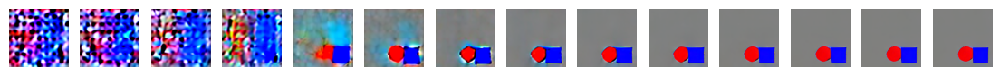

In [12]:
# original 
fig, ax = plt.subplots(1,14, figsize=(14,1))
generate_and_quantify_images(ax, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,num_images_per_prompt=1)

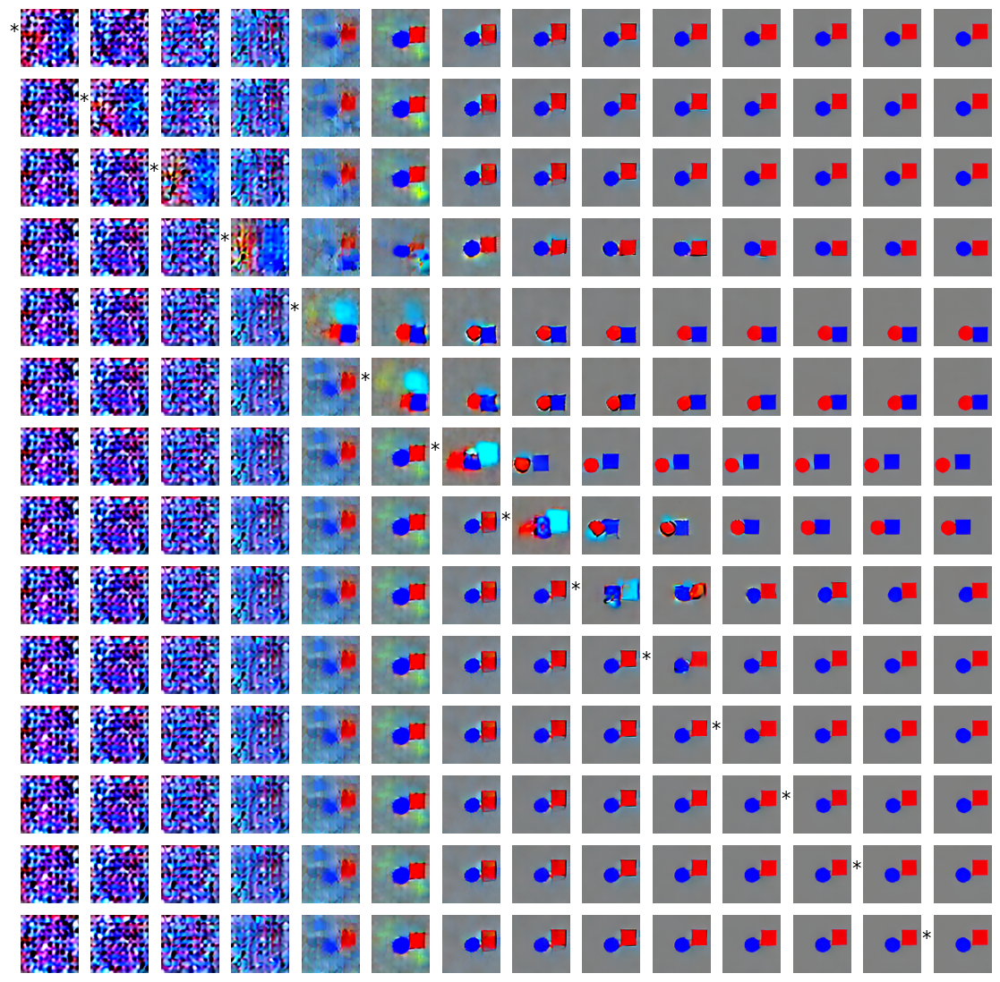

In [13]:
# for i in range(14):
fig, axeses = plt.subplots(14,14, figsize=(14,14))
for i, axes in enumerate(axeses):
    generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,num_images_per_prompt=1,inference_step_star=i,manipulated_mask_func=mask_semantic_parts_attention,one_step_mode=True,part_to_mask="colors")
#plot_image_grid(image_logs)

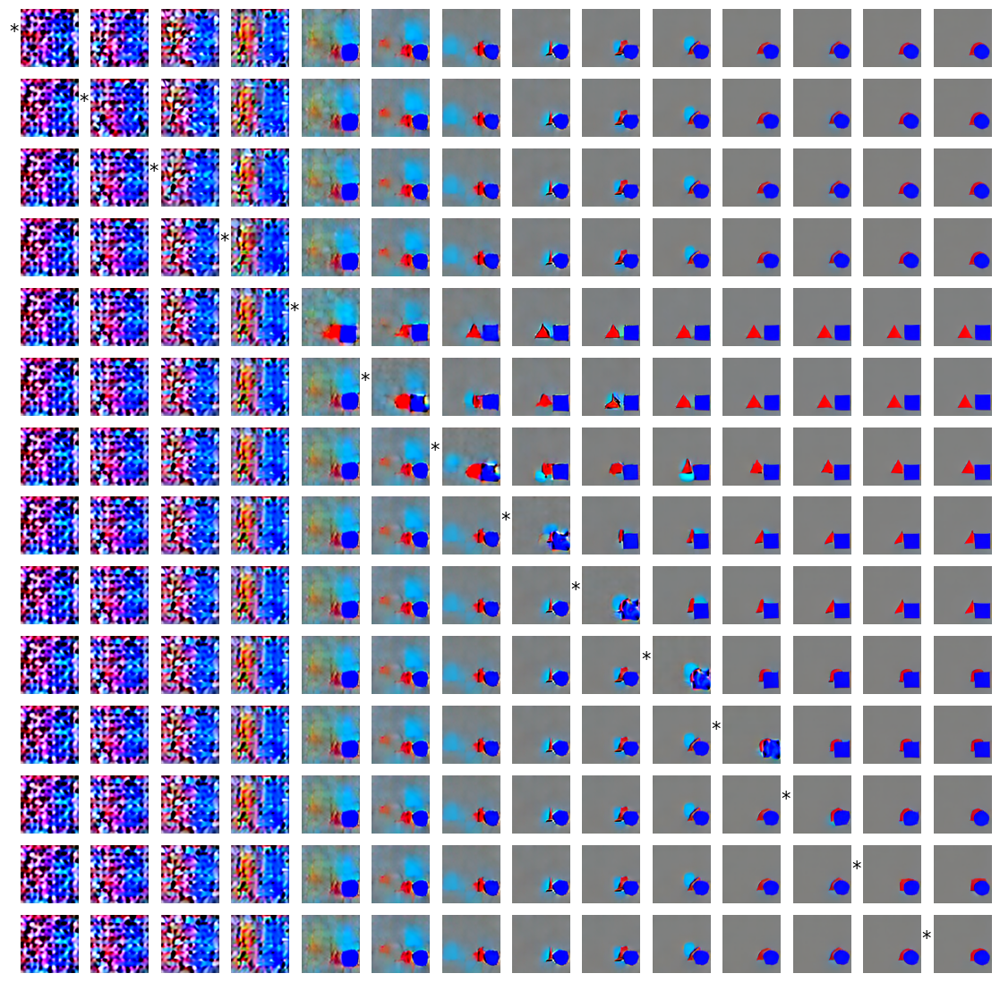

In [41]:
# for i in range(14):
fig, axeses = plt.subplots(14,14, figsize=(14,14))
for i, axes in enumerate(axeses):
    _ = generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,inference_step_star=i,manipulated_mask_func=mask_semantic_parts_attention,one_step_mode=True,part_to_mask="objects")
#plot_image_grid(image_logs)

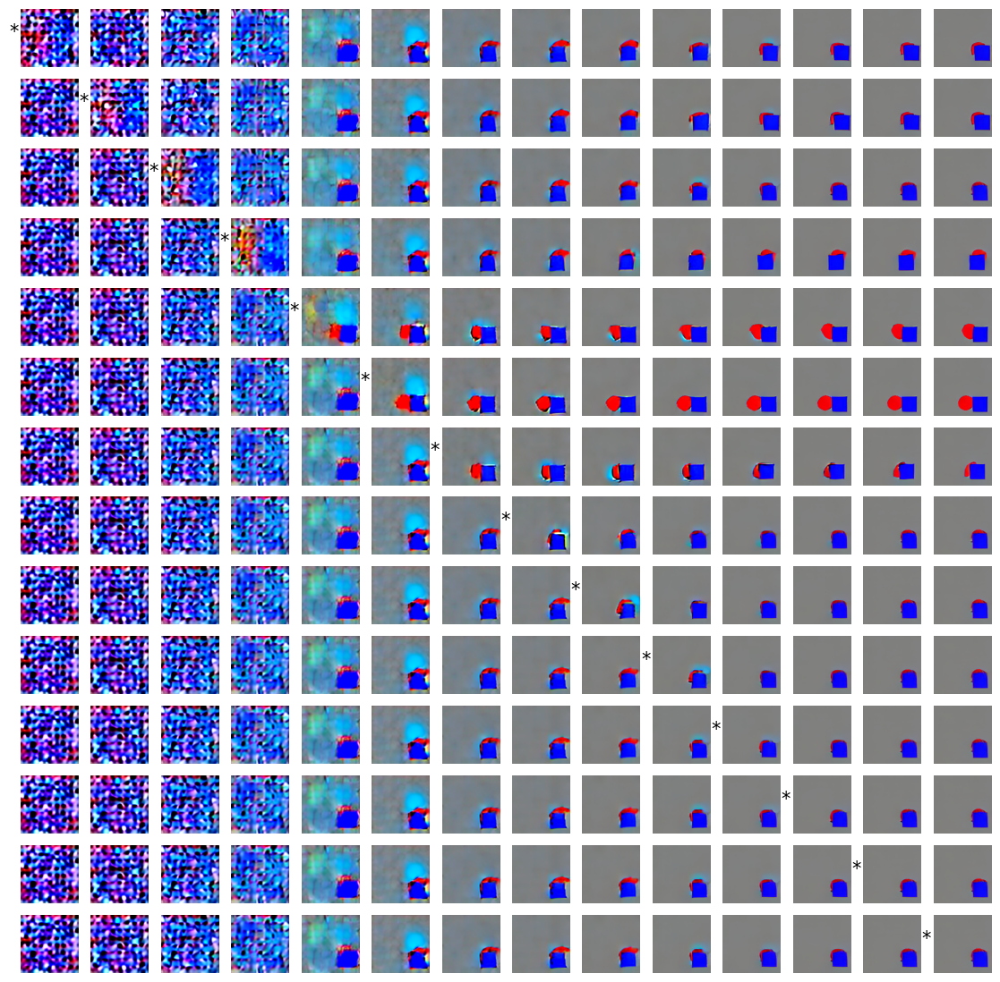

In [14]:
# for i in range(14):
fig, axeses = plt.subplots(14,14, figsize=(14,14))
for i, axes in enumerate(axeses):
    _ = generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,num_images_per_prompt=1,inference_step_star=i,manipulated_mask_func=mask_semantic_parts_attention,one_step_mode=True,part_to_mask="spatial")
#plot_image_grid(image_logs)

/n/holylabs/LABS/sompolinsky_lab/Users/xupan/envs/pixart/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


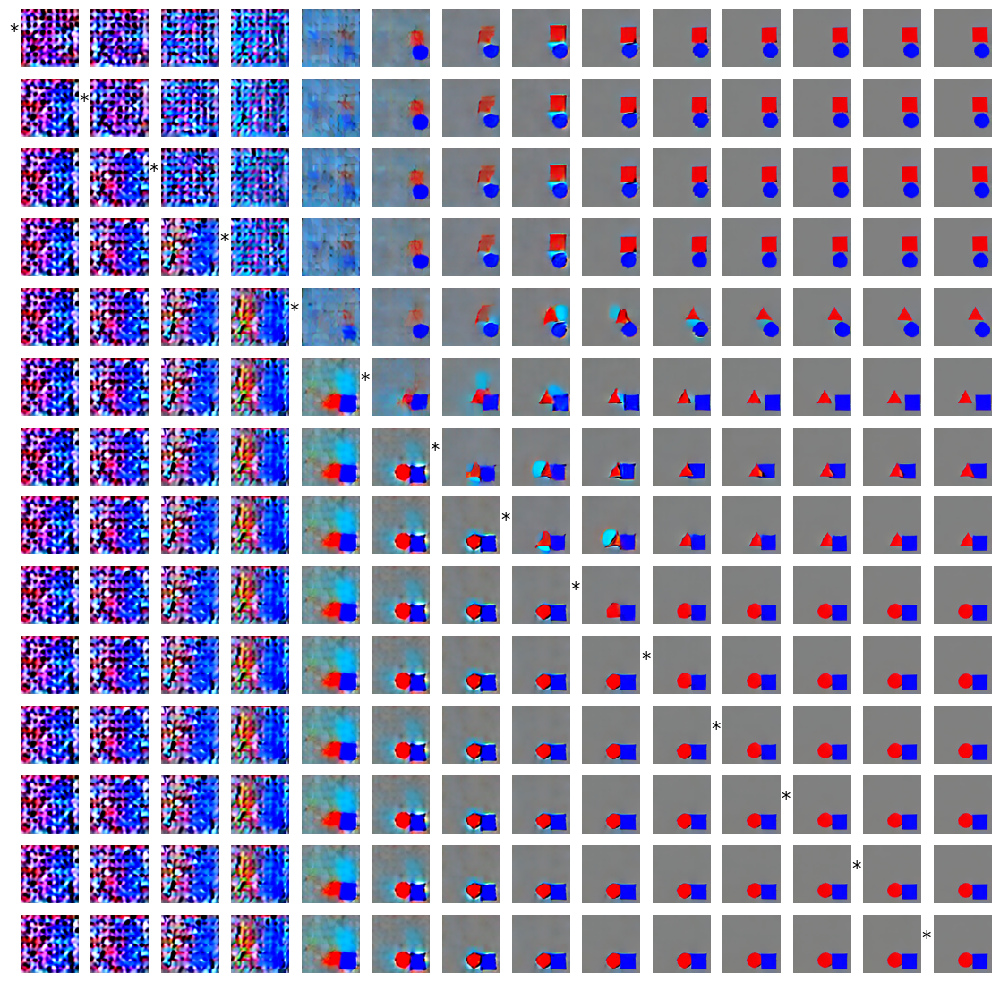

In [25]:
# for i in range(14):
fig, axeses = plt.subplots(14,14, figsize=(14,14))
for i, axes in enumerate(axeses):
    _ = generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,inference_step_star=i,manipulated_mask_func=mask_all_attention)
#plot_image_grid(image_logs)

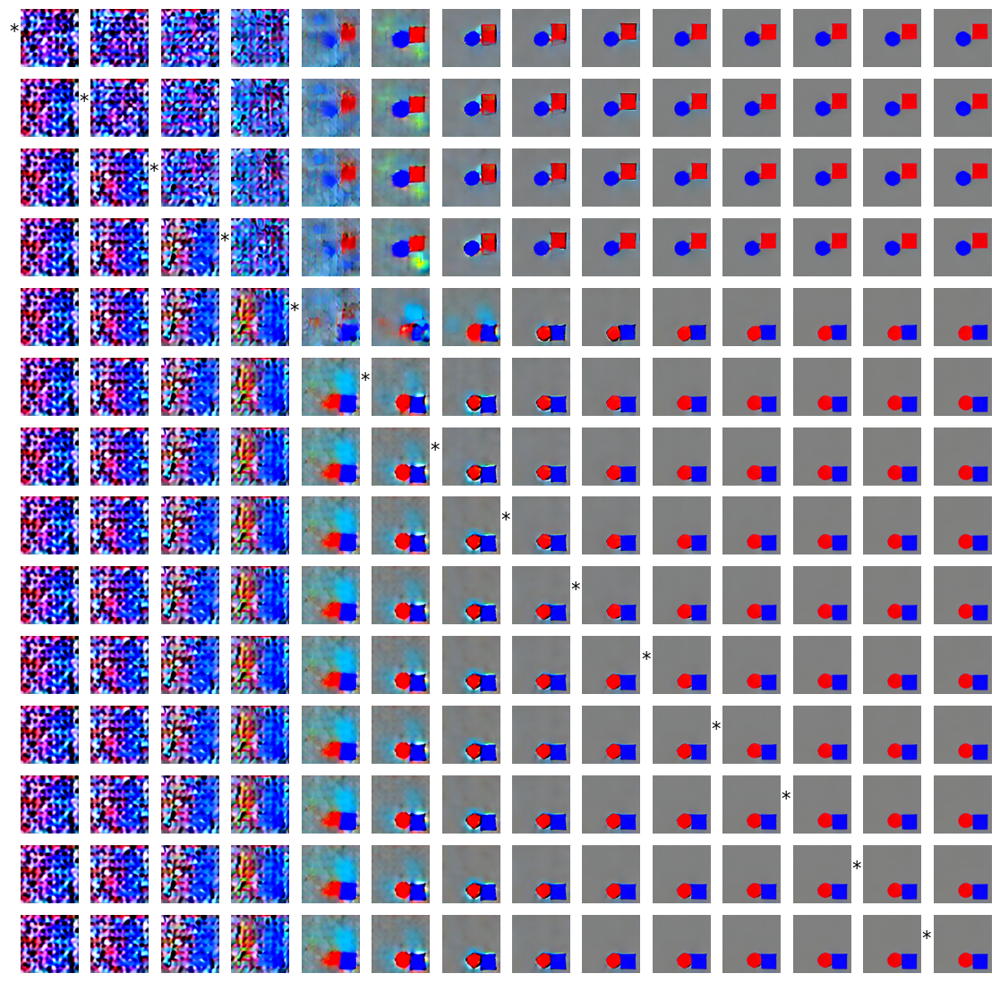

In [108]:
# for i in range(14):
fig, axeses = plt.subplots(14,14, figsize=(14,14))
for i, axes in enumerate(axeses):
    _ = generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,inference_step_star=i,manipulated_mask_func=mask_semantic_parts_attention,part_to_mask="colors")
#plot_image_grid(image_logs)

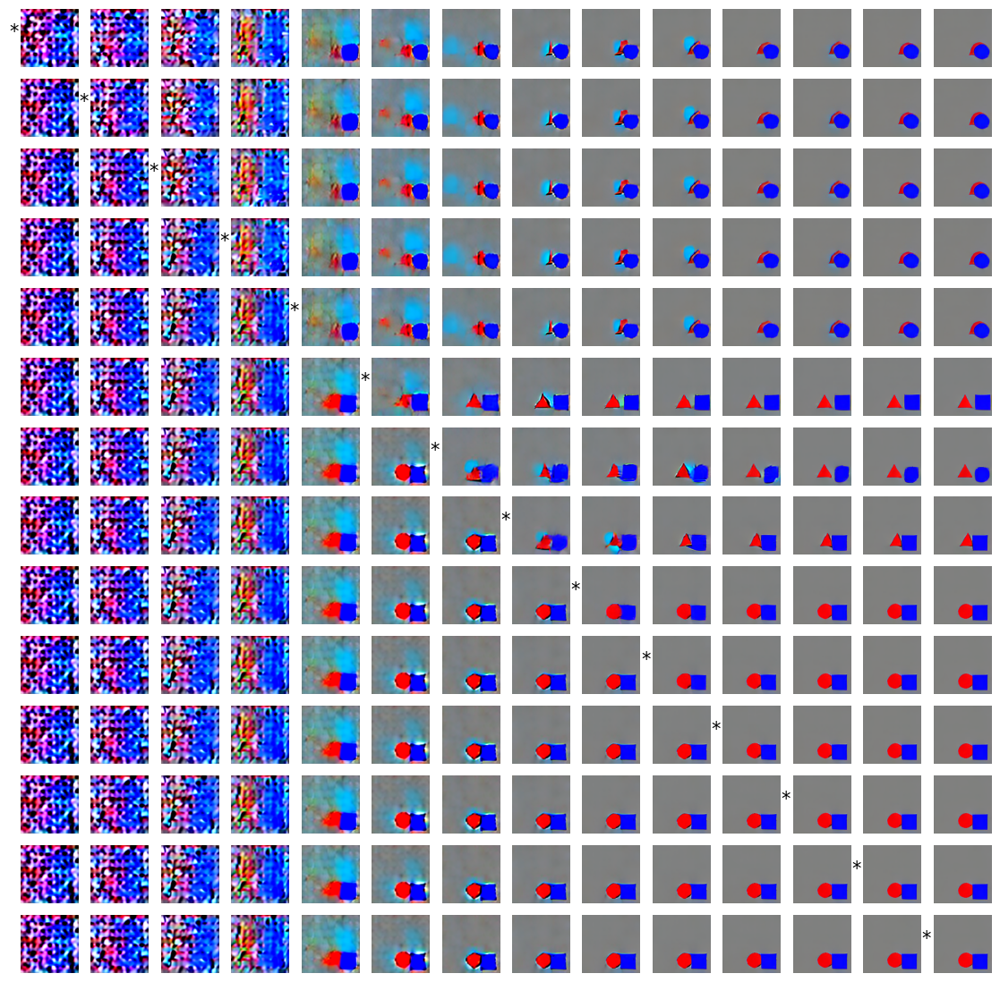

In [109]:
# for i in range(14):
fig, axeses = plt.subplots(14,14, figsize=(14,14))
for i, axes in enumerate(axeses):
    _ = generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,inference_step_star=i,manipulated_mask_func=mask_semantic_parts_attention,part_to_mask="objects")
#plot_image_grid(image_logs)

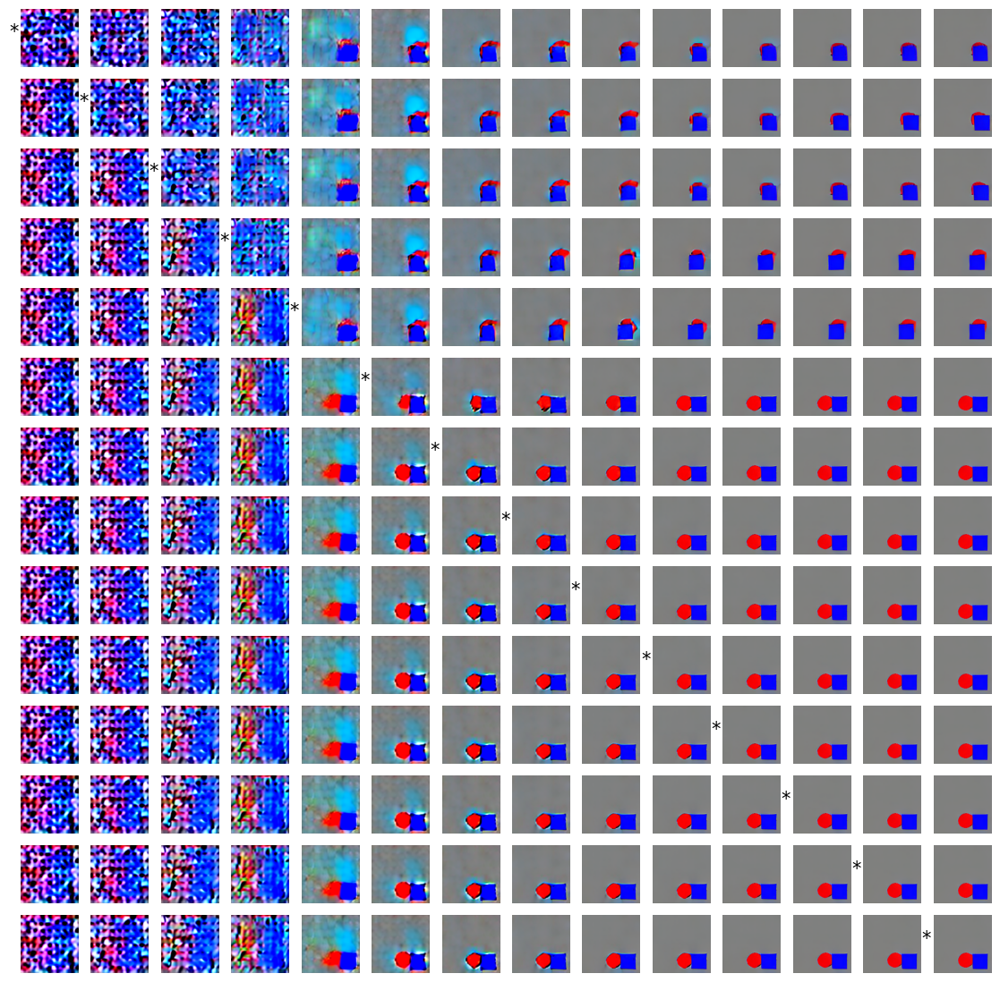

In [110]:
# for i in range(14):
fig, axeses = plt.subplots(14,14, figsize=(14,14))
for i, axes in enumerate(axeses):
    _ = generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,inference_step_star=i,manipulated_mask_func=mask_semantic_parts_attention,part_to_mask="spatial")
#plot_image_grid(image_logs)

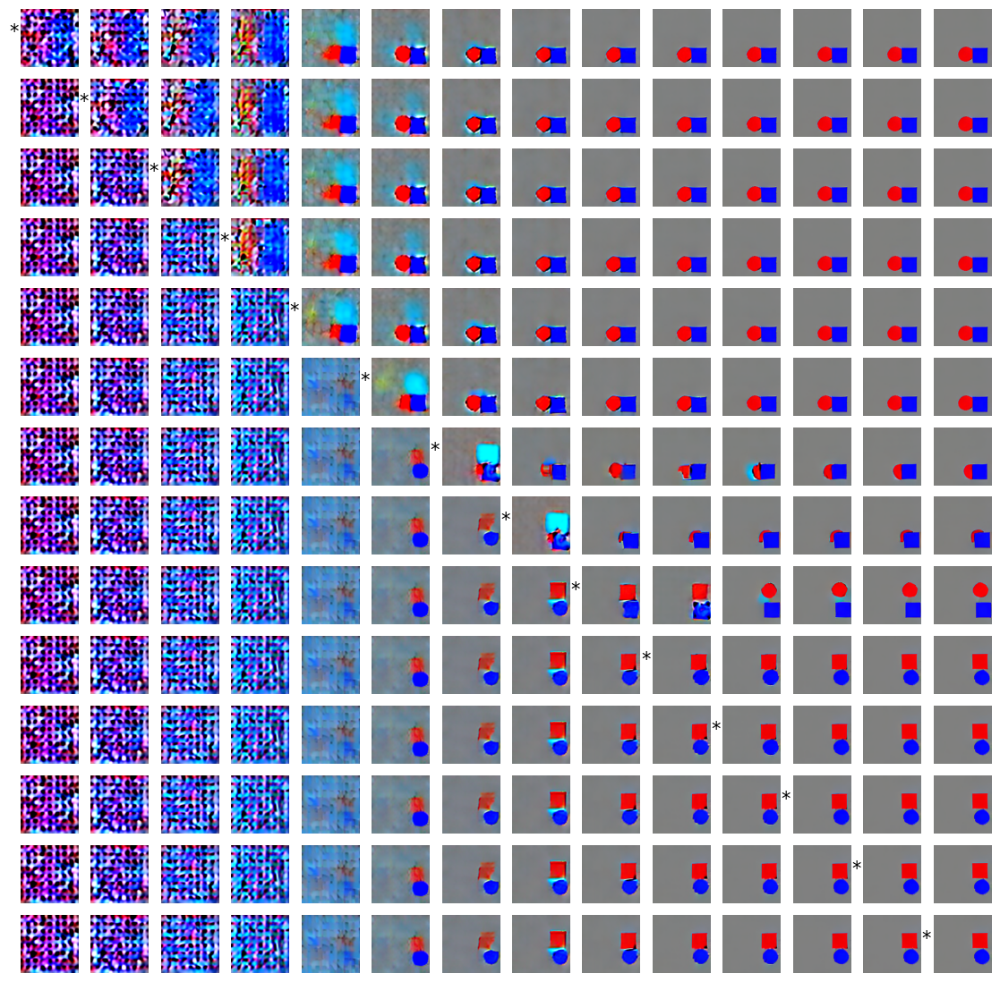

In [111]:
# for i in range(14):
fig, axeses = plt.subplots(14,14, figsize=(14,14))
for i, axes in enumerate(axeses):
    _ = generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,inference_step_star=i,manipulated_mask_func=mask_all_attention,reverse_mask=True)
#plot_image_grid(image_logs)

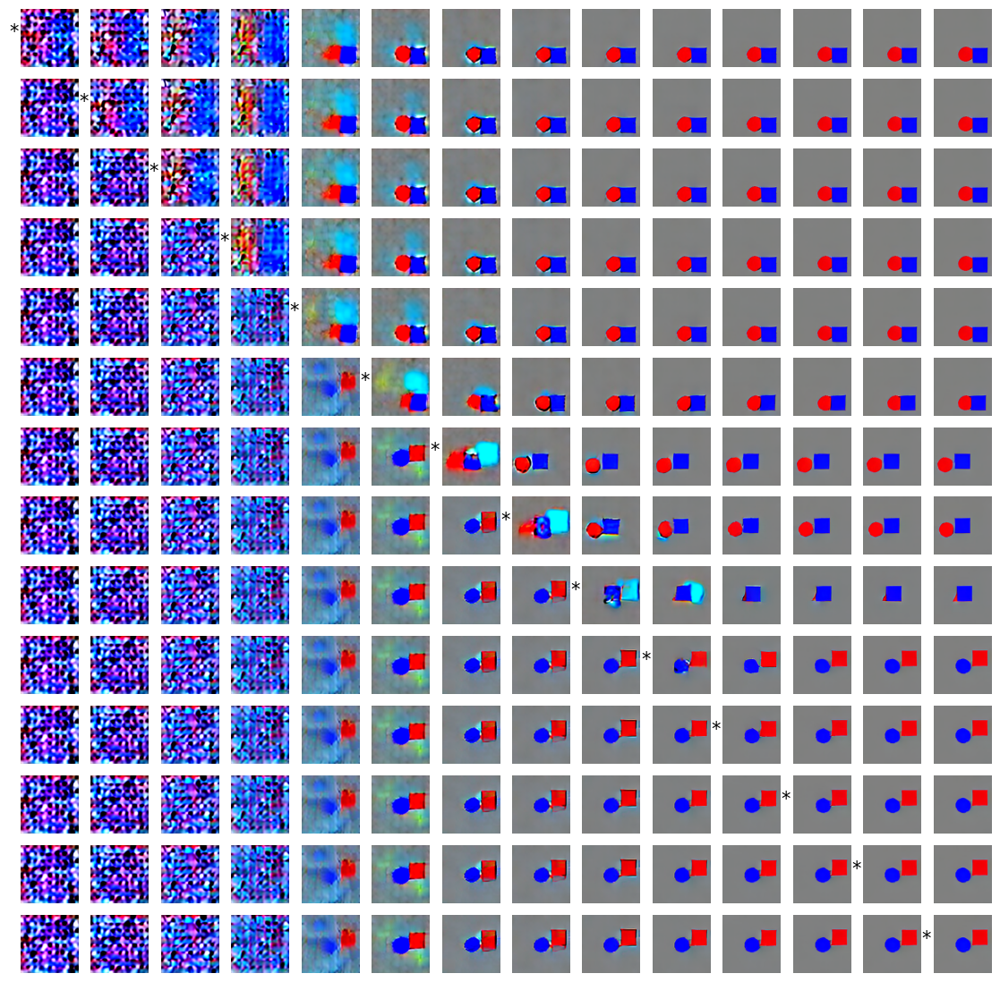

In [112]:
# for i in range(14):
fig, axeses = plt.subplots(14,14, figsize=(14,14))
for i, axes in enumerate(axeses):
    _ = generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,inference_step_star=i,manipulated_mask_func=mask_semantic_parts_attention,reverse_mask=True,part_to_mask="colors")
#plot_image_grid(image_logs)

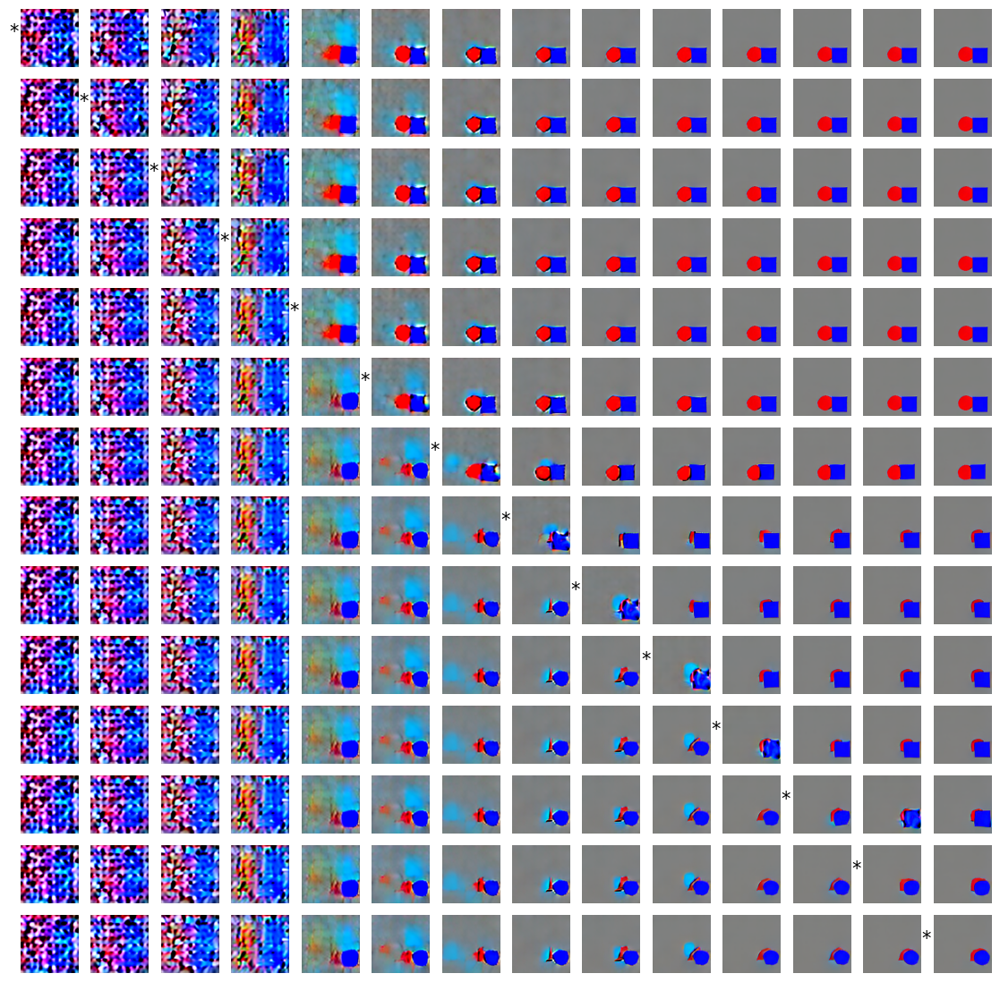

In [113]:
# for i in range(14):
fig, axeses = plt.subplots(14,14, figsize=(14,14))
for i, axes in enumerate(axeses):
    _ = generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,inference_step_star=i,manipulated_mask_func=mask_semantic_parts_attention,reverse_mask=True,part_to_mask="objects")
#plot_image_grid(image_logs)

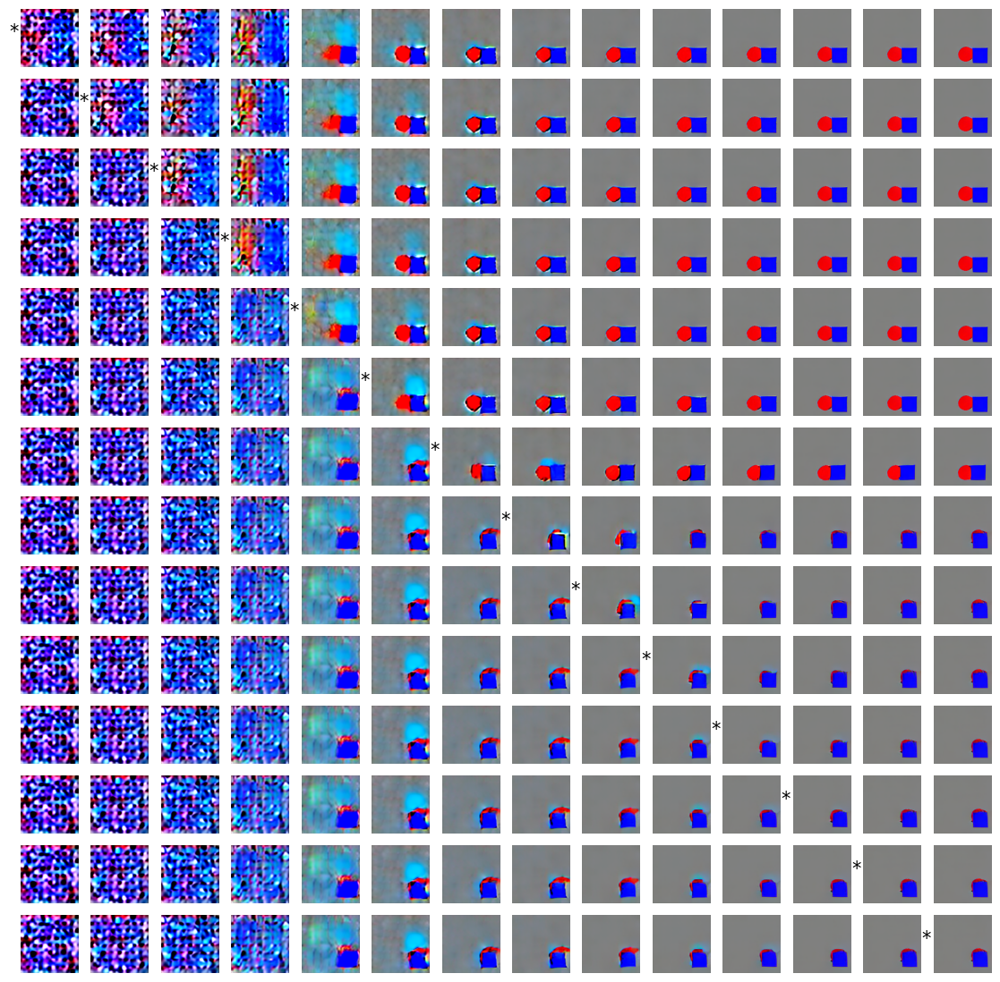

In [115]:
# for i in range(14):
fig, axeses = plt.subplots(14,14, figsize=(14,14))
for i, axes in enumerate(axeses):
    _ = generate_and_quantify_images(axes, pipeline, prompt, prompt_cache_dir, max_length=config.model_max_length, weight_dtype=weight_dtype,inference_step_star=i,manipulated_mask_func=mask_semantic_parts_attention,reverse_mask=True,part_to_mask="spatial")
#plot_image_grid(image_logs)

In [28]:
import json
import matplotlib.pyplot as plt
from collections import defaultdict
import re

def plot_manipulation_curves(json_path):
    """
    Load metrics from a JSON file and plot subplots for each metric:
      - 'original' values are shown as a horizontal line.
      - Other keys of the form 'step_<n>_<manipulation>' are grouped by manipulation
        and plotted as a line over step numbers.
    
    Parameters:
    -----------
    json_path : str
        Path to the JSON file containing the metrics data.
    """
    # Load the JSON data
    with open(json_path, 'r') as f:
        data = json.load(f)
    
    # Extract original baseline values
    original = data.get('original', {})
    metric_keys = list(original.keys())

    # Organize step data by manipulation
    manip_data = defaultdict(list)
    for key, metrics in data.items():
        if key == 'original':
            continue
        match = re.match(r'step_(\d+)_(.+)', key)
        if not match:
            continue
        step_num = int(match.group(1))
        manipulation = match.group(2)
        manip_data[manipulation].append((step_num, metrics))

    # Create subplots
    num_metrics = len(metric_keys)
    fig, axes = plt.subplots(num_metrics, 1, figsize=(10, 4 * num_metrics))
    if num_metrics == 1:
        axes = [axes]  # Ensure axes is iterable

    for ax, metric in zip(axes, metric_keys):
        # Plot original baseline
        ax.axhline(original[metric], color='gray', linestyle='--', label='original')

        # Plot each manipulation curve
        for manipulation, values in manip_data.items():
            # Sort by step number
            values_sorted = sorted(values, key=lambda x: x[0])
            steps = [v[0] for v in values_sorted]
            scores = [v[1][metric] for v in values_sorted]
            ax.plot(steps, scores, marker='o', label=manipulation)

        ax.set_title(metric)
        ax.set_xlabel('Step Number')
        ax.set_ylabel(metric)
        ax.legend()
        ax.grid(True)

    plt.tight_layout()
    plt.show()




In [ ]:
# Example usage:
plot_manipulation_curves('saved_metrics/ablate_before/red circle is to the left of blue square.json')

In [ ]:
# Example usage:
plot_manipulation_curves('saved_metrics/ablate_after/red circle is to the left of blue square.json')

In [ ]:
# Example usage:
plot_manipulation_curves('saved_metrics/one_step/red circle is to the left of blue square.json')